# Substitution patterns around hotspots

In [1]:
import os
from scipy import signal, stats
import numpy as np

# os.environ["MODIN_ENGINE"] = "ray"  # Modin will use Ray
# import modin.pandas as pd
import pandas as pd

import bisect
import importlib
import warnings
from pathlib import Path
import gc

from tqdm.notebook import trange, tqdm

import ete3
np.random.seed(7)

# import psutil, os
# def mem():
#     return psutil.Process(os.getpid()).memory_info().rss / 1024**3

Plotting setup:

In [2]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from matplotlib_inline.backend_inline import set_matplotlib_formats
#set_matplotlib_formats('pdf', 'svg')
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D
from matplotlib import gridspec

#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

# import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("white")
sns.set_context("notebook")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess

# My own paired palette replacing the last brown pair with violets
sns.color_palette('Paired').as_hex()
Paired = sns.color_palette(['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c',
                            '#fdbf6f', '#ff7f00', '#cab2d6','#6a3d9a', '#e585cf', '#ad009d'])
#sns.palplot(Paired)

from shared_vars_and_func import *

Monospace font for numbers in tables:

In [3]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

# Load species details

In [4]:
species_details = pd.read_csv('/home/kmt/Birds/faststorage/data/species_details.txt', sep='\t')
species_details.head()

,species2014,species,english,latin,group,family,male_min,male_max,female_min,female_max,weight,order,order2014,branch_length
0,PICPU,PICPU,Downy Woodpecker,Picoides pubescens,woodpecker,woodpeckers,"20,70","32,20","20,70","32,20","26,45",39,1,0.143370
1,MERNU,MERNU,Carmine Bee-eater,Merops nubicus,woodpecker,bee-eaters,"34,00","59,00","34,00","59,00","46,5",38,2,0.102957
2,BUCRH,BUCRH,Rhinoceros Hornbill,Buceros rhinoceros,woodpecker,hornbills,"2465,00","2960,00","2040,00","2330,00","2448,75",37,3,0.099782
3,APAVI,APAVI,Bar-tailed Trogon,Apaloderma vittatum,woodpecker,trogons,"55,00","55,00","55,00","55,00",55,36,4,0.104832
4,LEPDI,LEPDI,Cuckoo Roller,Leptosomus discolor,woodpecker,cockoo-roller,"160,00","301,00","160,00","301,00","230,5",35,5,0.066956


# Distance to CGI, TSS, TES, and promoter

Hotspot distance to center of closest CGI, TSS, TES, and promoter:

In [5]:
hotspot_anno_dist = pd.read_hdf('../results/hotspot_anno_dist.h5')

Plot distances from hotspot to center of annotation. Hotspots overlaping annotation is recorded as zero distance.

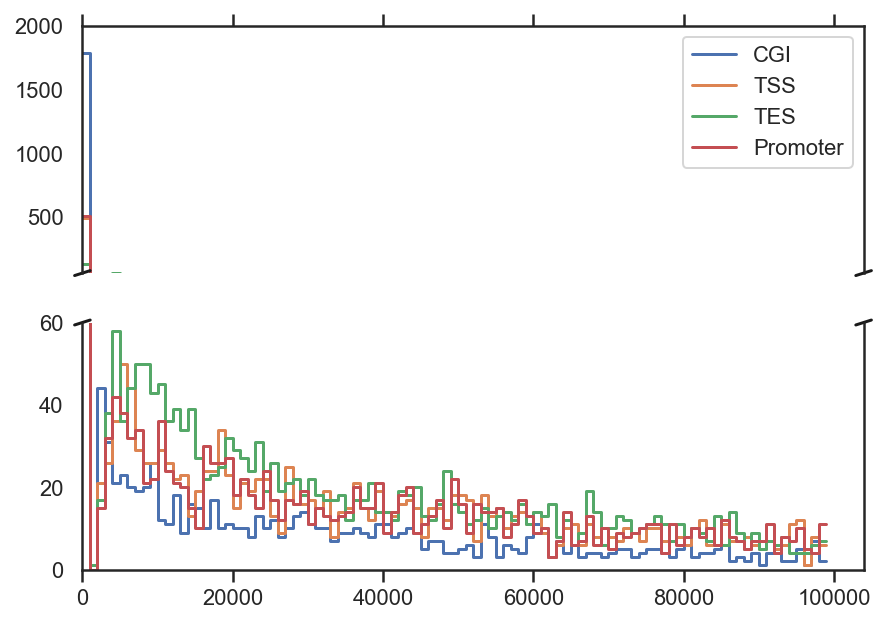

In [6]:
#fig, ax = plt.subplots(1, 1, figsize=(12, 4))
f, (ax, ax2) = plt.subplots(2, 1, sharex=True, figsize=(7, 5))


hist, bin_edges = np.histogram(hotspot_anno_dist.dist_cgi.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='CGI')
ax2.plot(df.pos, df.dens, label='CGI')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

hist, bin_edges = np.histogram(hotspot_anno_dist.dist_tss.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='TSS')
ax2.plot(df.pos, df.dens, label='TSS')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

hist, bin_edges = np.histogram(hotspot_anno_dist.dist_tes.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='TES')
ax2.plot(df.pos, df.dens, label='TES')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

hist, bin_edges = np.histogram(hotspot_anno_dist.dist_promoter.abs(), density=False, bins=range(0, 100000, 1000))
df = stairs(pd.DataFrame(dict(start=bin_edges[:-1], end=bin_edges[1:], dens=hist)))
ax.plot(df.pos, df.dens, label='Promoter')
ax2.plot(df.pos, df.dens, label='Promoter')
#ax.fill_between(df.pos, df.dens, alpha=0.1)

ax.legend()

# # zoom-in / limit the view to different portions of the data
ax.set_ylim(60, 2000)  # outliers only
ax2.set_ylim(0, 60)  # most of the data

# hide the spines between ax and ax2
ax.spines['bottom'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax.xaxis.tick_top()
ax.tick_params(labeltop=False)  # don't put tick labels at the top
ax2.xaxis.tick_bottom()

# This looks pretty good, and was fairly painless, but you can get that
# cut-out diagonal lines look with just a bit more work. The important
# thing to know here is that in axes coordinates, which are always
# between 0-1, spine endpoints are at these locations (0,0), (0,1),
# (1,0), and (1,1).  Thus, we just need to put the diagonals in the
# appropriate corners of each of our axes, and so long as we use the
# right transform and disable clipping.

d = .01  # how big to make the diagonal lines in axes coordinates
# arguments to pass to plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((-d, +d), (-d, +d), **kwargs)        # top-left diagonal
ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)  # top-right diagonal

kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)  # bottom-left diagonal
ax2.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # bottom-right diagonal

# What's cool about this is that now if we vary the distance between
# ax and ax2 via f.subplots_adjust(hspace=...) or plt.subplot_tool(),
# the diagonal lines will move accordingly, and stay right at the tips
# of the spines they are 'breaking'

#plt.ylim(0, 200)
plt.xlim(0) ;
plt.savefig(figures_path / 'distr_dist_from_cgi_tss_tes_prom.pdf')                

# GC*

## Hotspot strength

In [7]:
gc_star_table = pd.read_hdf('../results/gc_star_table.h5')
one_percent_gcstar_quantiles = pd.read_hdf('../results/one_percent_gcstar_quantiles.h5')

In [8]:
hotspot_strengths = (pd.merge((gc_star_table.loc[gc_star_table.bin == 0]
                               .groupby(['species', 'species_code'], observed=True)
                               .GCstar.mean()
                               .to_frame('GCstar_hot')
                               .reset_index()
                              ),
                              (gc_star_table.loc[gc_star_table.bin.abs() >= 20000]
                               .groupby(['species', 'species_code'], observed=True)
                               .GCstar.mean()
                               .to_frame('GCstar_flank')
                               .reset_index()
                              ),
                              on=['species', 'species_code']
                            )
                    .merge(one_percent_gcstar_quantiles, on=['species', 'species_code'], how='left')
                    )

from scipy.special import logit
hotspot_strengths['hotspot_strength'] = \
    (logit(hotspot_strengths.GCstar_hot) - logit(hotspot_strengths.GCstar_mut)) / \
    (logit(hotspot_strengths.GCstar_flank) - logit(hotspot_strengths.GCstar_mut))

hotspot_strengths['log_hotspot_strength'] = np.log2(hotspot_strengths['hotspot_strength'])

# hotspot_strengths['species'] = hotspot_strengths['species'].remove_unused_categories()
# hotspot_strengths['species_code'] = hotspot_strengths['species_code'].remove_unused_categories()

hotspot_strengths.head()

,species,species_code,GCstar_hot,GCstar_flank,GCstar_mut,hotspot_strength,log_hotspot_strength
0,Adelie Penguin,PYGAD,0.523548,0.423264,0.326277,1.971037,0.978955
1,American Crow,CORBR,0.434600,0.403973,0.373944,1.995552,0.996788
2,American Flamingo,PHORU,0.496554,0.457435,0.413774,1.882803,0.912882
3,Annas Hummingbird,CALAN,0.415101,0.377664,0.305797,1.488683,0.574037
4,Bald Eagle,HALLE,0.525179,0.399954,0.332445,2.737467,1.452841


In [9]:
hotspot_strengths.to_hdf('../results/hotspot_strengths.h5', 'df')

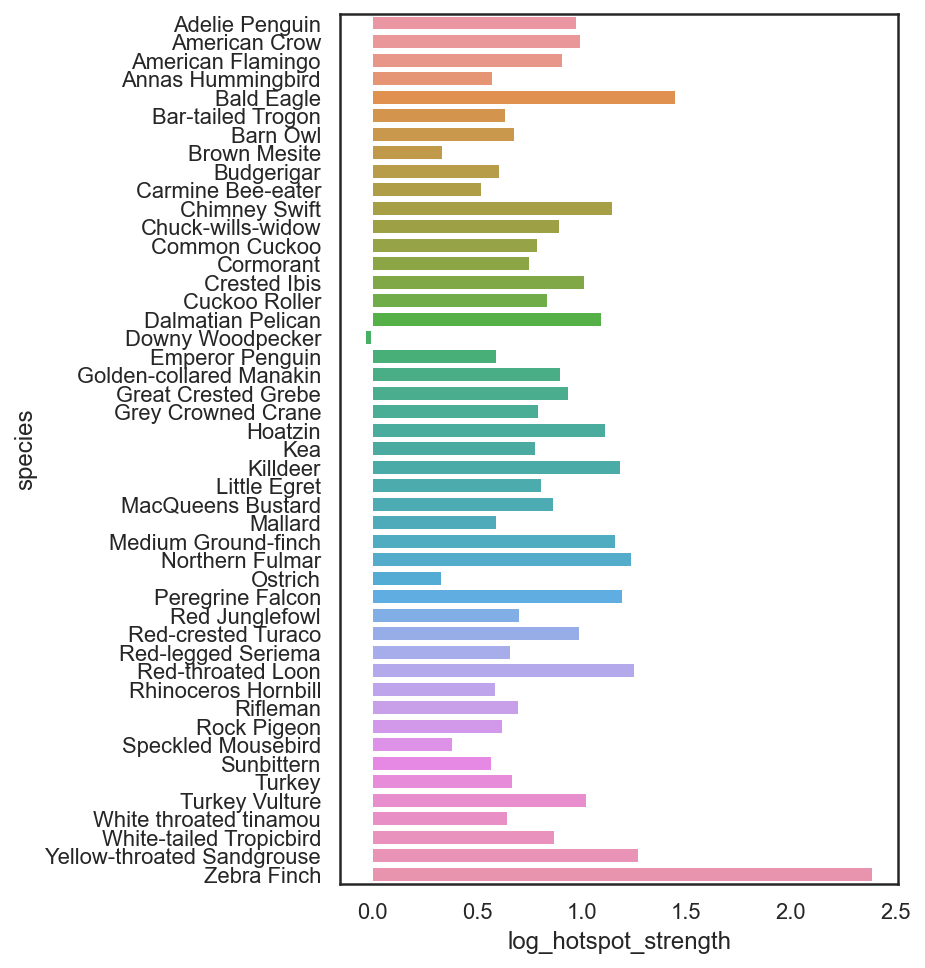

In [10]:
plt.figure(figsize=(5, 8))
sns.barplot(data=hotspot_strengths, y='species', x='log_hotspot_strength') ;

In [11]:
with open(data_path / 'tree_ancestors_species2014_english.txt') as f:
    s = f.read().strip()
tree = ete3.Tree(s, format=1)
tree.prune([x for x in tree.get_leaves() if x.name != 'HALAL_white-tailed_eagle'], preserve_branch_length=True)
    
data = pd.read_csv('/home/kmt/Birds/faststorage/data/fig1_data.txt', sep=' ')

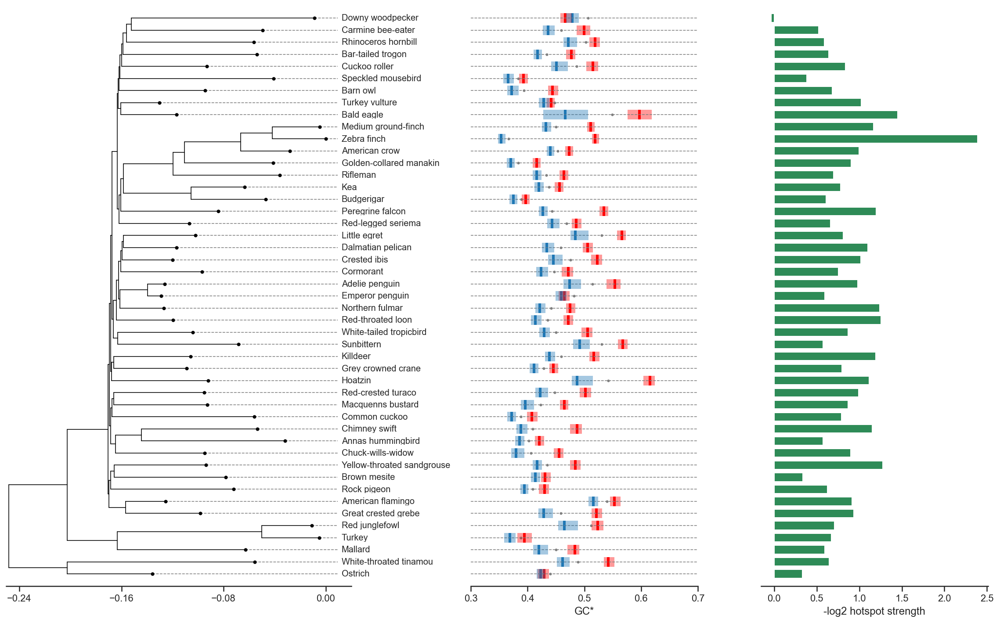

In [12]:
from plot_tree import plot_tree, make_comb_tree

from itertools import groupby
from operator import itemgetter

def jonas_plot(tree, data, figsize):

    with sns.axes_style('ticks'):


        fig = plt.figure(figsize=figsize) 
        gs0 = gridspec.GridSpec(1, 2, figure=fig, width_ratios=[2, 3], hspace=0)
        ax0 = fig.add_subplot(gs0[0])
        gs01 = gs0[1].subgridspec(1, 2, width_ratios=[1, 1], hspace=0)
        ax1 = fig.add_subplot(gs01[0], sharey=ax0, xmargin=10)
        ax2 = fig.add_subplot(gs01[1], sharey=ax0)


        # fig = plt.figure(figsize=figsize) 
        # gs = matplotlib.gridspec.GridSpec(1, 3, 
        #                                   width_ratios=[1, 1, 1],
        #                                  ) 
        # ax0 = plt.subplot(gs[0])
        # ax1 = plt.subplot(gs[1])
        # ax2 = plt.subplot(gs[2])



        # with sns.axes_style('whitegrid'):

        leaf_info = plot_tree(tree, ax0, margins=(1, 0.02, 1, 0.002), 
                              fontsize=10, align_labels=True)

        names, _, _ = list(zip(*leaf_info))
        data = data.loc[data.species.isin([n.split('_', 1)[0] for n in names])]

        # ax0.grid(False)
        # ax0.spines['top'].set_visible(False) 
        # ax0.spines['left'].set_visible(False) 
        # ax0.spines['right'].set_visible(False) 
        # ax0.spines['bottom'].set_visible(False)
        # ax0.get_xaxis().set_visible(False)



        names, x_coords, y_coords = zip(*leaf_info)

        for n, x, y in zip(names, x_coords, y_coords):

            n = n.split('_', 1)[0]

            tup = next(data.loc[data.species == n].itertuples())

            # ax1.add_patch(Rectangle((tup.fmin, y-0.5),tup.fmax-tup.fmin,1,linewidth=0, edgecolor=None, facecolor='tab:blue', alpha=0.3, zorder=10))
            ax1.add_patch(Rectangle((tup.fmin, y-0.4),tup.fmax-tup.fmin,0.8,linewidth=0, edgecolor=None, facecolor='tab:blue', alpha=0.4, zorder=10))
            # ax1.add_patch(Rectangle((tup.fmin, y-0.5),tup.fmax-tup.fmin,0.5,linewidth=0, edgecolor=None, facecolor='tab:blue', alpha=0.7, zorder=10))

            # ax1.add_line(Line2D((tup.fmid, tup.fmid), (y-0.5, y+0.5), color='darkgrey', solid_capstyle='butt', zorder=1))
            ax1.add_line(Line2D((tup.fmid, tup.fmid), (y-0.4, y+0.4), color='tab:blue', linewidth=3, solid_capstyle='butt', zorder=1))
            # ax1.add_line(Line2D((tup.fmid, tup.fmid), (y-0.5, y), color='darkgrey', solid_capstyle='butt', zorder=1))

            # ax1.add_patch(Rectangle((tup.hmin, y-0.5),tup.hmax-tup.hmin,1,linewidth=0, edgecolor=None, facecolor='tab:red', alpha=0.3, zorder=2))                
            ax1.add_patch(Rectangle((tup.hmin, y-0.4),tup.hmax-tup.hmin,0.8,linewidth=0, edgecolor=None, facecolor='red', alpha=0.4, zorder=2))                
            # ax1.add_patch(Rectangle((tup.hmin, y),tup.hmax-tup.hmin,0.5,linewidth=0, edgecolor=None, facecolor='tab:red', alpha=0.7, zorder=2))                

            # ax1.add_line(Line2D((tup.hmid, tup.hmid), (y-0.5, y+0.5), color='red', solid_capstyle='butt', zorder=3))     
            ax1.add_line(Line2D((tup.hmid, tup.hmid), (y-0.4, y+0.4), color='red', linewidth=3, solid_capstyle='butt', zorder=3))     
            # ax1.add_line(Line2D((tup.hmid, tup.hmid), (y, y+0.5), color='red', solid_capstyle='butt', zorder=3))     

            # ax1.add_line(Line2D((tup.fmid*tup.skew, tup.fmid*tup.skew), (y-0.5, y+0.5), color='black', solid_capstyle='butt', linestyle='dotted', zorder=4))
            # ax1.add_line(Line2D((tup.fmid*tup.skew, tup.fmid*tup.skew), (y-0.5, y+0.5), color='black', solid_capstyle='butt', linestyle='dotted', zorder=4))

            ax1.scatter([tup.fmid*tup.skew], [y], color='grey', s=4)

        # for y in range(len(leaf_info)+1):
        #     ax1.axhline(y=y-0.5, color='black', linewidth=0.8, zorder=5)   
        for y in range(len(leaf_info)):
            ax1.axhline(y=y, color='grey', linewidth=0.8, linestyle='dashed', zorder=5)               

        ax1.set_xlabel('GC*')
        ax1.get_yaxis().set_visible(False)

#         def format_func(value, tick_number):
#             if value % 100000:
#                 return '' # only ticks for even 100
#             return "{:.1f}".format((value + start)/1000000)

#         ax1.xaxis.set_major_formatter(plt.FuncFormatter(format_func))

        ax1.grid(False)
        ax1.spines['top'].set_visible(False) 
        ax1.spines['left'].set_visible(False) 
        ax1.spines['right'].set_visible(False) 
        # ax1.spines['bottom'].set_visible(False) 

        ax1.set_xlim(0.3, 0.7)
        ax1.set_ylim(ax0.get_ylim())
        
    with sns.axes_style('ticks'):
        
        # order hotspot_strengths like tree
        df = hotspot_strengths.set_index('species_code').loc[[n.split('_', 1)[0] for n in names][::-1]]

        ax2.barh(list(range(len(leaf_info))), df.log_hotspot_strength, color='seagreen', height=0.7) 
        ax2.set_xlabel('-log2 hotspot strength')
        ax2.get_yaxis().set_visible(False)

        ax2.grid(False)
        ax2.spines['top'].set_visible(False) 
        ax2.spines['left'].set_visible(False) 
        ax2.spines['right'].set_visible(False) 
        # ax2.spines['bottom'].set_visible(False) 

        # ax2.set_xlim(0.3, 0.7)
        ax2.set_ylim(ax0.get_ylim())

        #sns.despine()

#        ax0.set_in_layout(True)
        
        plt.tight_layout()    
        # gs0.tight_layout(fig, pad=0)    

    return fig

with sns.plotting_context('notebook'):
    fig = jonas_plot(tree, data, figsize=(16, 10))
    plt.savefig(figures_path / 'poster_tree_with_gcstar_hotspot_strength.pdf')

## GC* across hotspots

In [13]:
gc_star = pd.read_hdf('../results/gc_star.h5')
gc_star_incl_cpg = pd.read_hdf('../results/gc_star_incl_cpg.h5')

Excluding CpG sites:

AttributeError: 'Line2D' object has no property 'errorbar'

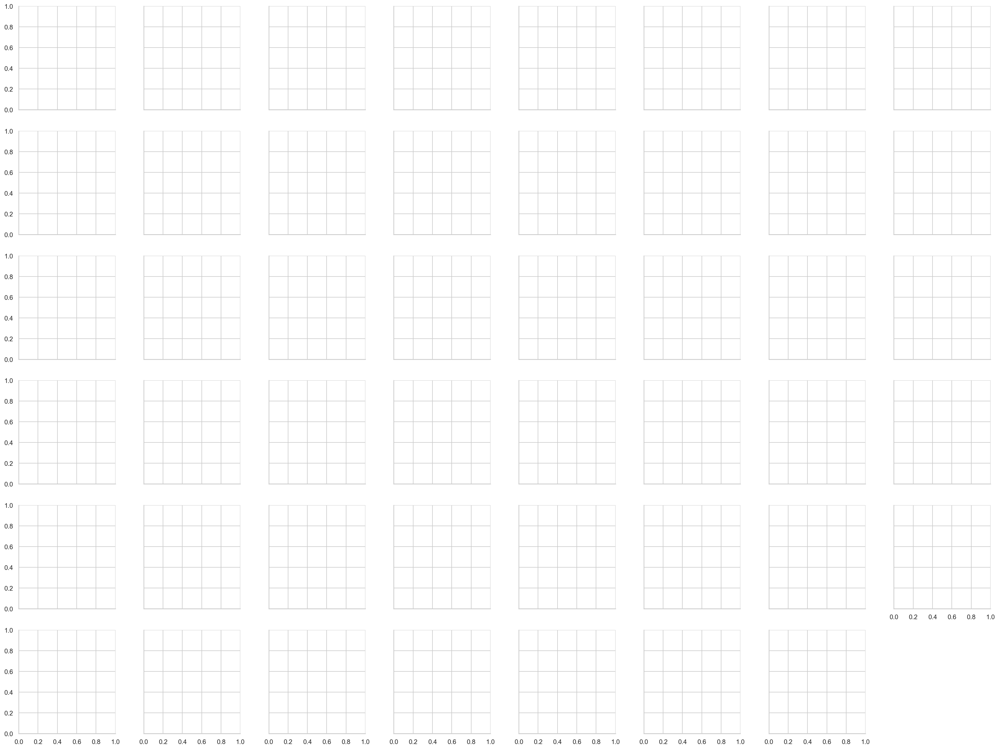

In [14]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', errorbar=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_hotspots.pdf')                    

Including CpG sites:

In [ ]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star_incl_cpg,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', errorbar=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_hotspots_incl_CpG.pdf')                    

Three observations:
    
- The magnitude of the GCstar peak varies dramatically between birds. This is in part determined by the long-term species Ne.
- The Downy woodpecker does not have any peak at all. This could be due to miniscule Ne or that it does not use Zebra finch hotspots.

- The background level in flanks of GCstar differs dramatically between transversion and transitions across species. That must be because transversions can be more of less GC-biased than transitions in each species. I.e. it varies accross species how much transitions and transversion contribute to equilibrium GC content.
- The GCstar of transversions at hotspots vs flanks seems to show a slightly higher peak.

Below are larger plots of the two penguins for non-CpG sites:

In [ ]:
plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & gc_star.species_code.isin(['PYGAD', 'APTFO'])].copy()
# plot_df.species.cat.remove_unused_categories(inplace=True)
plot_df['species'] = plot_df['species'].cat.remove_unused_categories()

with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable', legend_out=True,
                      sharey=True, height=4, aspect=1)
    g.map(sns.lineplot, 'bin', 'frequency', errorbar=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_hotspots_penguins.pdf')                    

The woodpecker and ostrich show no or almost no GCstar peaks. That could be due to extremely small long-term Ne. However, in "Temporal Dynamics of Avian Populations during Pleistocene Revealed by Whole-Genome Sequences" these two species do not seem to show any inherrent tendency for such small population sizes. Another possible reason could be that the alignment is so poor for these species that the gBGC signal is "swamped" by false positive substitutions. However, if this was the case, then the hotspot which shows the fewest aligned bases should show a peak in all rates - which is does not.

In fact, whereas the alignment quality does not seem to affect estimated rates, it does seem to be natural consequence of a higher recombination rate: more recombination will produce more structural variation that is harder to align. We analyze the dependency on alignmnet quality below.

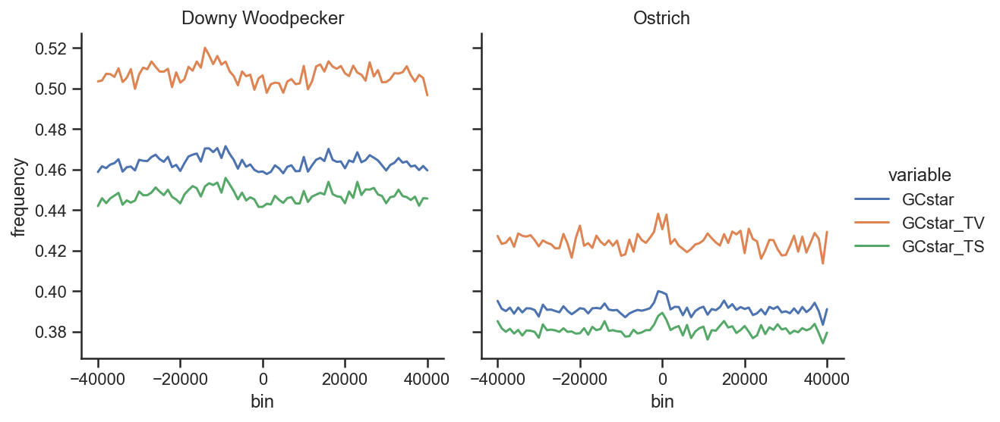

In [17]:
plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & gc_star.species_code.isin(['PICPU', 'STRCA'])].copy()
# plot_df.species.cat.remove_unused_categories(inplace=True)
plot_df['species'] = plot_df['species'].cat.remove_unused_categories()

with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable', legend_out=True,
                      sharey=True, height=4, aspect=1)
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_hotspots_woodpecker_ostrich.pdf')                        

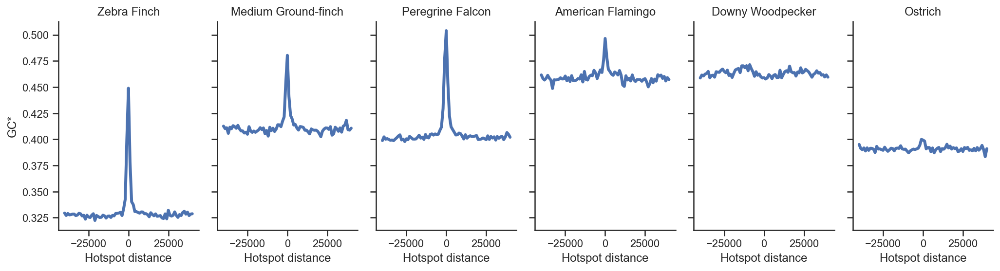

In [18]:
plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & \
                      gc_star.species.isin(example_species) & \
                     (gc_star.variable == 'GCstar')].copy()
# plot_df.species.cat.remove_unused_categories(inplace=True)
plot_df['species'] = plot_df['species'].cat.remove_unused_categories()
with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable', legend_out=True, col_wrap=6,
                      sharey=True, height=4, aspect=0.6, col_order=example_species)
    g.map(sns.lineplot, 'bin', 'frequency', ci=None, linewidth=3)#.add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_ylabels('GC*')
    g.set_xlabels('Hotspot distance')
    plt.savefig(figures_path / 'poster_two_species_GCstar_across_hotspots.pdf')  

In [19]:
# plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & \
#                       gc_star.species.isin(example_species) & \
#                      (gc_star.variable == 'GCstar')].copy()
# # plot_df.species.cat.remove_unused_categories(inplace=True)
# plot_df['species'] = plot_df['species'].cat.remove_unused_categories()
# with sns.axes_style('ticks'):
#     g = sns.FacetGrid(plot_df,
#                       col='species', hue='variable', legend_out=True, col_wrap=3,
#                       sharey=True, height=4, aspect=1, col_order=example_species)
#     g.map(sns.lineplot, 'bin', 'frequency', errorbar=None, linewidth=3)#.add_legend()
#     g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
#     g.set_ylabels('GC*')
#     g.set_xlabels('Hotspot distance')
#     plt.savefig(figures_path / 'poster_two_species_GCstar_across_hotspots.pdf')                            

## GC* vs GC content in hotspots and flanks

In [20]:
hotspot_data = pd.read_hdf('../results/hotspot_data.h5')
hotspot_data.head()

,ancestor,bin,chrom,end,end_orig,end_prox,nA,nA2C,nA2G,nA2T,...,rA2T,rC2A,rC2G,rC2T,rG2A,rG2C,rG2T,rT2A,rT2C,rT2G
0,Anc44,0.0,1,0,6895000,6894116,94,2,3,1,...,0.010204,0.000000,0.000000,0.043956,0.008547,0.000000,0.017094,0.009709,0.019417,0.009709
1,Anc44,0.0,1,0,8806000,8805005,295,1,6,2,...,0.006780,0.012739,0.000000,0.006369,0.017045,0.000000,0.017045,0.014760,0.014760,0.007380
2,Anc44,0.0,1,0,9688000,9687030,291,2,4,1,...,0.003436,0.005208,0.010417,0.010417,0.019048,0.000000,0.019048,0.006711,0.006711,0.006711
3,Anc44,0.0,1,0,10398000,10397061,261,3,6,2,...,0.007663,0.009804,0.000000,0.019608,0.048193,0.006024,0.006024,0.003610,0.028881,0.000000
4,Anc44,0.0,1,0,10504000,10503751,113,0,1,2,...,0.018349,0.006289,0.000000,0.012579,0.025316,0.018987,0.012658,0.014085,0.014085,0.007042


In [21]:
gc_star = pd.read_hdf('../results/gc_star.h5')
gc_star_incl_cpg = pd.read_hdf('../results/gc_star_incl_cpg.h5')
gc_star.head()

,species,species_code,bin,variable,frequency
0,Adelie Penguin,PYGAD,-40000.0,GCstar,0.416807
1,Adelie Penguin,PYGAD,-39000.0,GCstar,0.415546
2,Adelie Penguin,PYGAD,-38000.0,GCstar,0.423878
3,Adelie Penguin,PYGAD,-37000.0,GCstar,0.424261
4,Adelie Penguin,PYGAD,-36000.0,GCstar,0.418351


In [22]:
gc_star_ratios = pd.read_hdf('../results/gc_star_ratios.h5')
gc_star_ratios_incl_cpg = pd.read_hdf('../results/gc_star_ratios_incl_cpg.h5')
gc_star_ratios.head()

,species,variable,ratio
0,Adelie Penguin,GCstar,1.232231
1,American Crow,GCstar,1.075214
2,American Flamingo,GCstar,1.085448
3,Annas Hummingbird,GCstar,1.098613
4,Bald Eagle,GCstar,1.310535


Compute GC content:

In [23]:
gc_counts = hotspot_data.nG + hotspot_data.ng + hotspot_data.nC + hotspot_data.nc
at_counts = hotspot_data.nA + hotspot_data.nT
gc_contents = gc_counts / (gc_counts + at_counts)
gc_contents.index = pd.MultiIndex.from_frame(hotspot_data[['species', 'species_code', 'bin']])
gc_contents.head()

species        species_code  bin
American Crow  CORBR         0.0    0.535963
                             0.0    0.397642
                             0.0    0.408225
                             0.0    0.419913
                             0.0    0.593651
dtype: float64

In [24]:
mean_species_gc_contents = gc_contents.to_frame(name='GCcontent').groupby('species').mean()

Compute GC star in hotspots and flanks:

In [25]:
def get_gc_star_in_flanks(df):
    return df.loc[(df.bin.abs() < 40000) & (df.bin.abs() >= 20000)].groupby(['species', 'variable']).frequency.mean()

def get_gc_star_at_center(df):
    return df.loc[df.bin == 0].groupby(['species', 'variable']).frequency.mean()


flanks = get_gc_star_in_flanks(gc_star).unstack()
center = get_gc_star_at_center(gc_star).unstack()

Plot GC star vs. GC content. The dashed line is the diagonal. So flanks seem to be descreasing in GC content whereas centers are increasing.

In [26]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=False, sharey=False)

# plot_df = mean_species_gc_contents.join(flanks)
# sns.regplot(x=plot_df.GCstar, y=plot_df.GCcontent, ax=ax1)
# ax1.set_title('Flanks')

# plot_df = mean_species_gc_contents.join(center)
# sns.regplot(x=plot_df.GCstar, y=plot_df.GCcontent, ax=ax2)
# ax2.set_title('Center')
 
# plt.tight_layout()
# plt.savefig(figures_path / 'GCstar_against_GC_regresison.pdf')                        

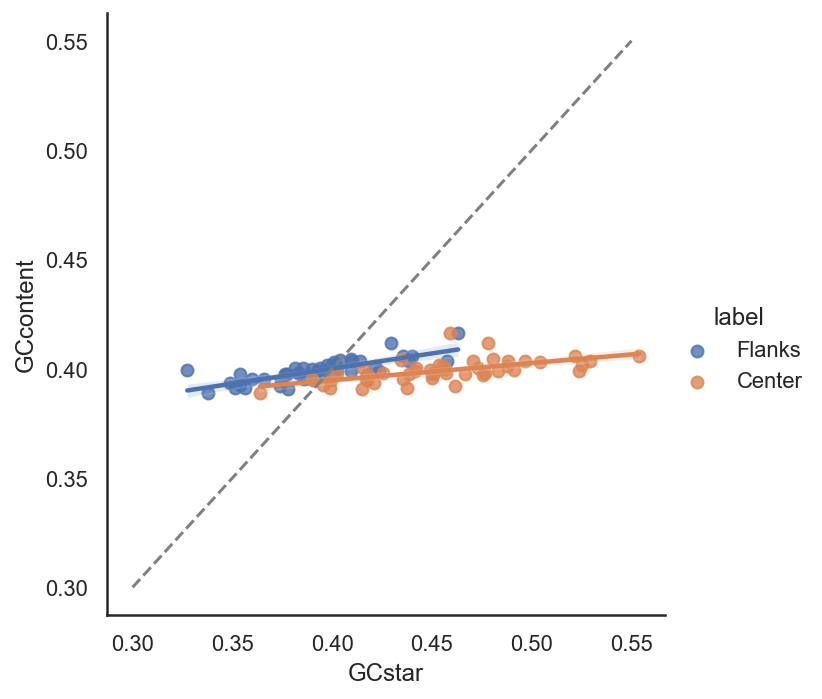

In [27]:
plot_df = pd.concat([mean_species_gc_contents.join(flanks).assign(label='Flanks'),
                     mean_species_gc_contents.join(center).assign(label='Center')])
sns.lmplot(data=plot_df, x='GCstar', y='GCcontent', hue='label')
plt.plot([0.3, 0.55], [0.3, 0.55], '--', color='grey')
# plt.xlim((0.31, 0.56))
# plt.ylim((0.3, 0.56))
#plt.ylim((0.38, 0.42))
plt.savefig(figures_path / 'GCstar_against_GC_regresison.pdf')                        

## Calculate B

Compute population scaled gBGC selection coeficient following box 1 in C. F. Mugal et al.: GC-biased gene conversion links the recombination landscape and demography to genomic base composition.

$b=\frac{\ln\big(\frac{1-{GC}^*}{GC^* R}\big)}{2(1-2N)\ln(e)} = \frac{\ln\big(\frac{1-{GC}^*}{{GC}^* R}\big)}{2(1-2N)}$

$B \approx - \frac{\ln\big(\frac{1-{GC}^*}{{GC}^* R}\big)}{4}$


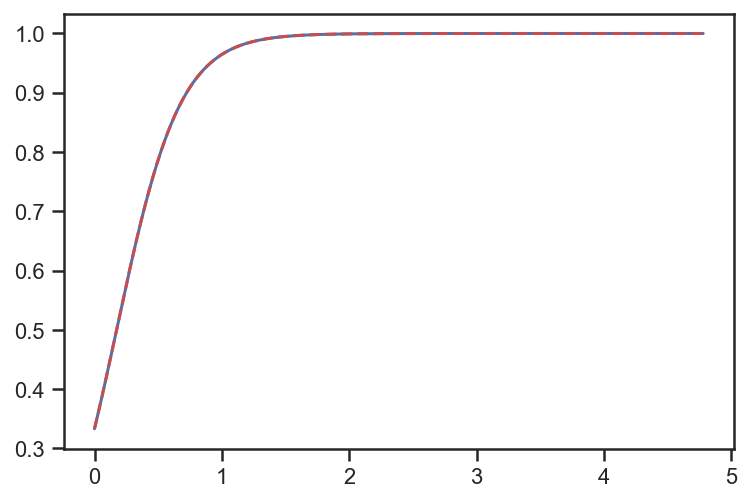

In [28]:
from math import log
import numpy as np

def b(GCstar, N, R):
    return log((1-GCstar) / (GCstar * R)) / (2*(1-2*N))

def B(GCstar, R):
    return - log((1-GCstar) / (GCstar * R)) / 4

# R = 1.5
# with sns.axes_style('ticks'):
#     x = np.linspace(0.4, 0.99999999, 10000)
#     plt.plot([b(y, 10000, R=R) for y in x], x, 'b-')
#     plt.plot([B(y, R=R)/10000 for y in x], x, 'r--')

#     plt.plot([b(y, 100000, R=R) for y in x], x, 'b-')
#     plt.plot([B(y, R=R)/100000 for y in x], x, 'r--')
#     plt.xlim(0, 5e-5)

with sns.axes_style('ticks'):
    x = np.linspace(0.333, 0.99999999, 100000)
    plt.plot([b(y, R=2, N=10000)*10000 for y in x], x, 'b-')
    plt.plot([B(y, R=2) for y in x], x, 'r--')

To compute B, we need R, the relative mutation rate from GC to AT of 2.

**Approach 1:** Assume a relative mutation rate from GC to AT of 2 (to allow a GC content in flanks as low as 1/3)

In [29]:
mean_species_gc_contents = gc_contents.to_frame(name='GCcontent').groupby('species').mean()

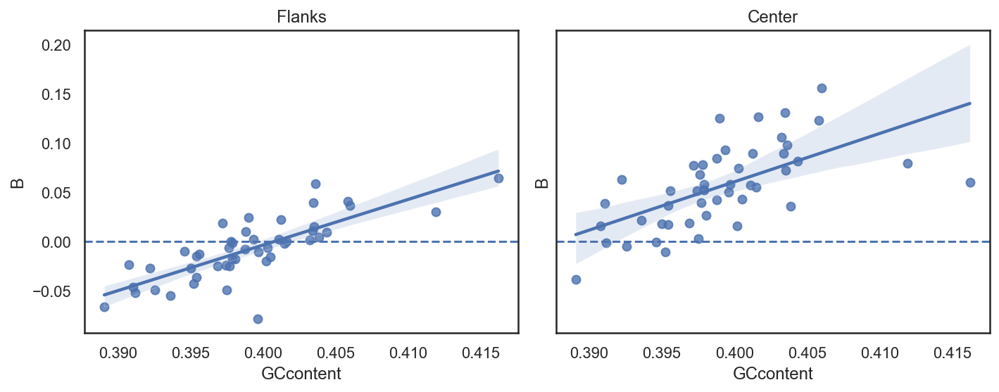

In [30]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)

# assume an R: relative mutation rate from GC to AT
R = 1.5

plot_df_flanks = mean_species_gc_contents.join(flanks)
sns.regplot(x=plot_df_flanks.GCcontent, y=[B(x, R=R) for x in plot_df_flanks.GCstar], ax=ax1)
ax1.set_ylabel('B')
ax1.set_title('Flanks')
ax1.axhline(0, linestyle='--')

plot_df_center = mean_species_gc_contents.join(center)
sns.regplot(x=plot_df_center.GCcontent, y=[B(x, R=R) for x in plot_df_center.GCstar], ax=ax2)
ax2.set_ylabel('B')
ax2.set_title('Center')
ax2.axhline(0, linestyle='--')
 
plt.tight_layout()
plt.savefig(figures_path / 'B_against_GC_regresison.pdf')                        

**Approach 2:** Assume a that flanks in each species are neutral and reflect R only:

${GC}^* = R / (1+R) \Rightarrow R = 1/{GC}^* - 1$




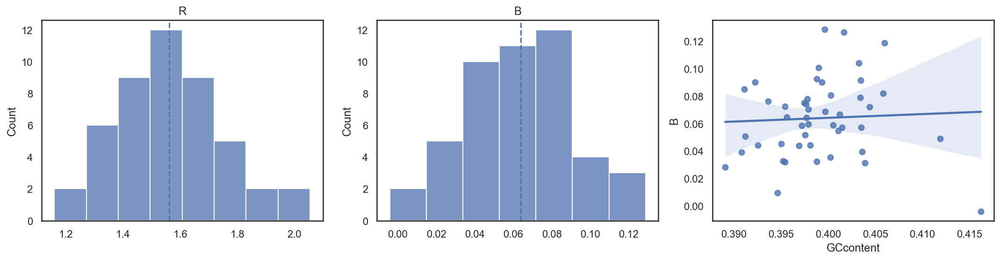

In [31]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))

R_values = [1/x-1 for x in plot_df_flanks.GCstar]
sns.histplot(R_values, ax=ax1)
ax1.set_title('R')
ax1.axvline(np.mean(R_values), linestyle='dashed')

B_values = [B(x, y) for (x, y) in zip(plot_df_center.GCstar, R_values)]
sns.histplot(B_values, ax=ax2)
ax2.set_title('B')
ax2.axvline(np.mean(B_values), linestyle='dashed')

sns.regplot(x=plot_df_flanks.GCcontent, y=B_values, ax=ax3)
ax3.set_ylabel('B')

plt.tight_layout()
plt.savefig(figures_path / 'R_B_and_GC.pdf')                        

## GC* center/flank transition, transversion

In [32]:
def compute_gc_star_ratios(df):
    flank = get_gc_star_in_flanks(df)
    center = get_gc_star_at_center(df)
    ratios = (center / flank).reset_index().rename(columns={'frequency': 'ratio'})
    ratios_df = ratios.pivot(index='species', columns='variable', values='ratio').rename(columns=str).reset_index()
    ratios = ratios_df.melt(id_vars=['species'], var_name='variable', value_name='ratio')
    return ratios

gc_star_ratios = compute_gc_star_ratios(gc_star)
gc_star_ratios_incl_cpg = compute_gc_star_ratios(gc_star_incl_cpg)

gc_star_ratios.head()

,species,variable,ratio
0,Adelie Penguin,GCstar,1.236237
1,American Crow,GCstar,1.075611
2,American Flamingo,GCstar,1.085756
3,Annas Hummingbird,GCstar,1.099226
4,Bald Eagle,GCstar,1.312777


In [33]:
gc_star_ratio_table = gc_star_ratios.pivot(index='species', columns='variable', values='ratio')
gc_star_ratio_table_incl_cpg = gc_star_ratios_incl_cpg.pivot(index='species', columns='variable', values='ratio')

gc_star_ratio_table.head()

variable,GCstar,GCstar_TS,GCstar_TV
species,,,
Adelie Penguin,1.236237,1.236088,1.236647
American Crow,1.075611,1.058042,1.129426
American Flamingo,1.085756,1.084048,1.090181
Annas Hummingbird,1.099226,1.089138,1.126219
Bald Eagle,1.312777,1.295226,1.360608


Difference between GCstar computed form transitions and transversions

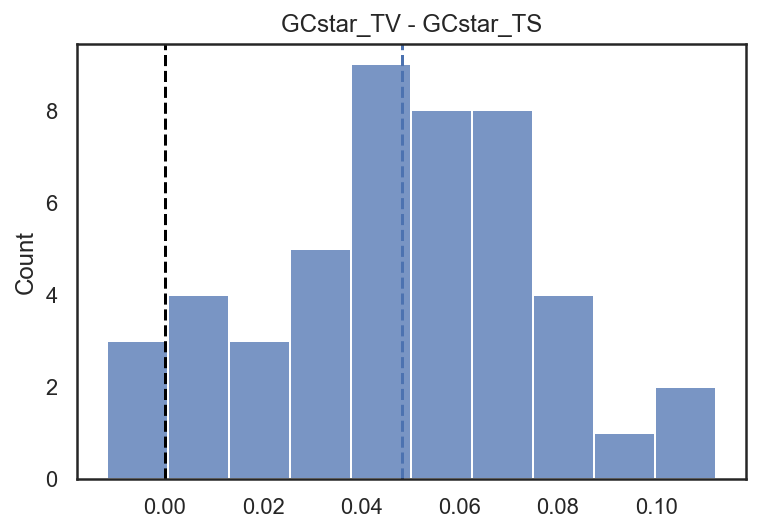

In [34]:
sns.histplot(gc_star_ratio_table.GCstar_TV - gc_star_ratio_table.GCstar_TS, bins=10)
plt.axvline(x=(gc_star_ratio_table.GCstar_TV - gc_star_ratio_table.GCstar_TS).mean(), linestyle='dashed') ;
plt.axvline(x=0, linestyle='dashed', color='black') 
plt.title('GCstar_TV - GCstar_TS') ;
plt.savefig(figures_path / 'GCstar_TV_TS_diff_hist.pdf')                        

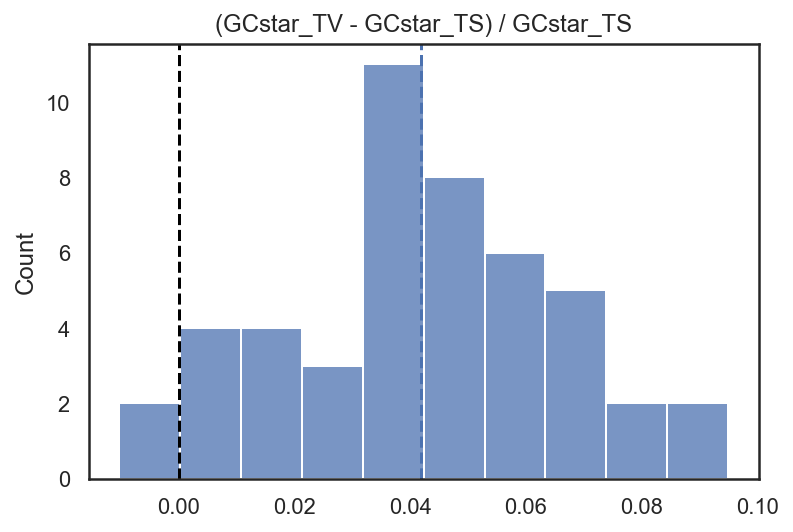

In [35]:
rel_diff = (gc_star_ratio_table.GCstar_TV - gc_star_ratio_table.GCstar_TS) / gc_star_ratio_table.GCstar_TS
sns.histplot(rel_diff, bins=10)
plt.axvline(x=rel_diff.mean(), linestyle='dashed') ;
plt.axvline(x=0, linestyle='dashed', color='black') 
plt.title('(GCstar_TV - GCstar_TS) / GCstar_TS') ;
plt.savefig(figures_path / 'GCstar_TV_TS_rel_diff_hist.pdf')                        

Excluding CpG sites:

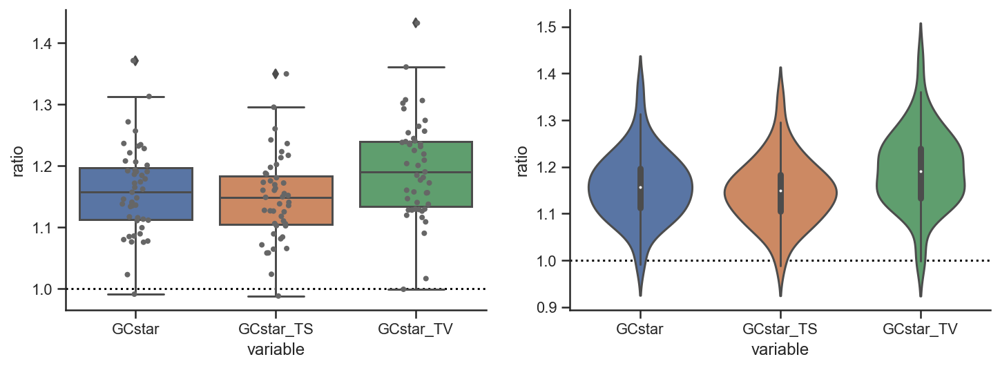

In [36]:
with sns.axes_style('ticks'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    sns.stripplot(x="variable", y="ratio", jitter=True, data=gc_star_ratios, 
                  color='#666666', ax=ax1, size=4)
    sns.boxplot(x="variable", y="ratio", data=gc_star_ratios, ax=ax1)
    ax1.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.violinplot(x="variable", y="ratio", data=gc_star_ratios, ax=ax2)
    ax2.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.despine()
    plt.savefig(figures_path / 'GCstar_box_and_violin.pdf')                            

Including CpG sites:

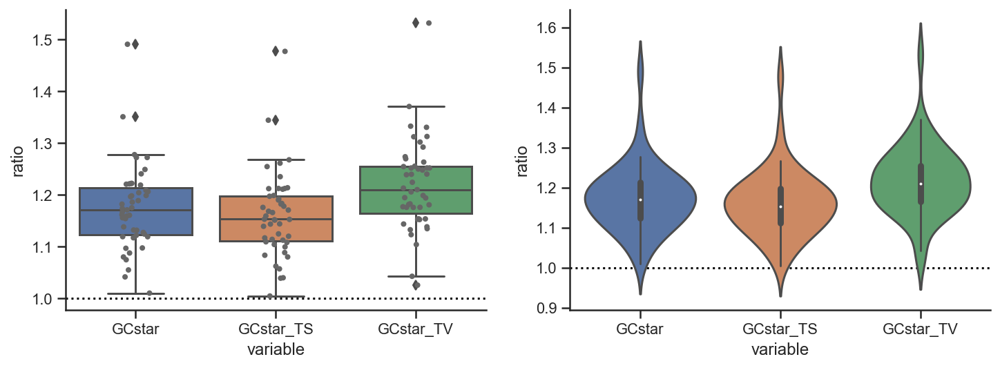

In [37]:
with sns.axes_style('ticks'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    sns.stripplot(x="variable", y="ratio", jitter=True, data=gc_star_ratios_incl_cpg, 
                  color='#666666', ax=ax1, size=4)
    sns.boxplot(x="variable", y="ratio", data=gc_star_ratios_incl_cpg, ax=ax1)
    ax1.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.violinplot(x="variable", y="ratio", data=gc_star_ratios_incl_cpg, ax=ax2)
    ax2.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.despine()
    plt.savefig(figures_path / 'GCstar_box_and_violin_incl_CpG.pdf')                                

Significance of diference with paired t-test:

Shapiro-Wilk test for normality (second val is p) ShapiroResult(statistic=0.9906073212623596, pvalue=0.967065691947937)


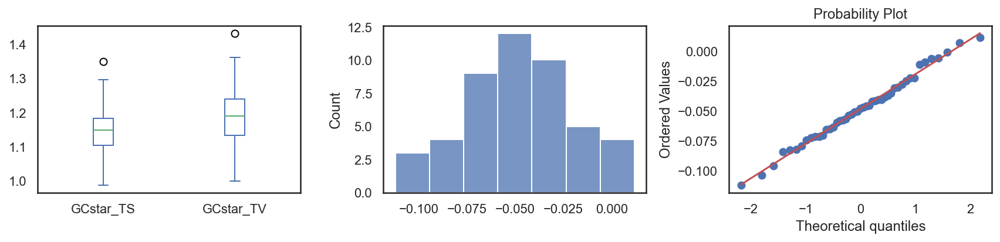

In [38]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3))

gc_star_ratio_table[['GCstar_TS', 'GCstar_TV']].plot(kind='box', ax=ax1) ;

diff = gc_star_ratio_table['GCstar_TS'] - gc_star_ratio_table['GCstar_TV']
sns.histplot(diff, ax=ax2) ;

stats.probplot(diff, plot=ax3)

plt.tight_layout()

print("Shapiro-Wilk test for normality (second val is p)", stats.shapiro(diff))

stats.ttest_rel(gc_star_ratio_table['GCstar_TS'], gc_star_ratio_table['GCstar_TV'])
plt.savefig(figures_path / 'GCstar_TV_TS_pairted_ttest.pdf')                            

Same but including CpG sites:

Shapiro-Wilk test for normality (second val is p) ShapiroResult(statistic=0.9906073212623596, pvalue=0.967065691947937)


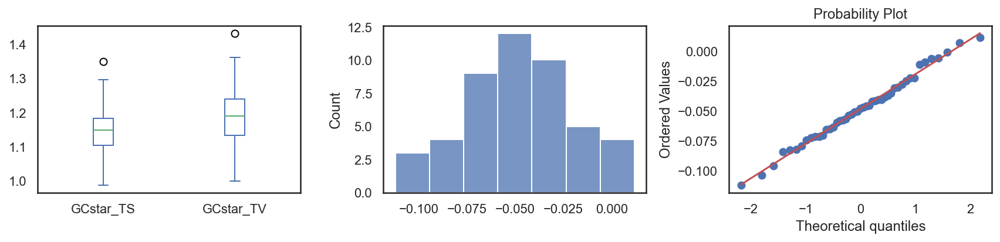

In [39]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3))

gc_star_ratio_table[['GCstar_TS', 'GCstar_TV']].plot(kind='box', ax=ax1) ;

diff = gc_star_ratio_table['GCstar_TS'] - gc_star_ratio_table['GCstar_TV']
sns.histplot(diff, ax=ax2) ;

stats.probplot(diff, plot=ax3)

plt.tight_layout()

print("Shapiro-Wilk test for normality (second val is p)", stats.shapiro(diff))

stats.ttest_rel(gc_star_ratio_table['GCstar_TS'], gc_star_ratio_table['GCstar_TV'])
plt.savefig(figures_path / 'GCstar_TV_TS_pairted_ttest_incl_CpG.pdf')                            

> TODO: PLOT GC_STAR RATIO FOR TS AND TV WITH ERROR BARS FOR EACH SPECIES. MUCH LIKE PLOT WITH SUBSTITUTION PATTERNS

## GC* ratio hotspots overlapping and not overlapping CGIs

In [40]:
subst_data = pd.read_hdf('../results/subst_data.h5')
subst_data.head()

,species,species_code,ancestor,hotspot_center,bin,branch_length,ultra_branch_length,nr_aligned,pattern,rate,type
0,American Crow,CORBR,Anc44,6894116,0.0,0.038474,0.035454,409,rA2C,0.530445,Transversion
1,American Crow,CORBR,Anc44,8805005,0.0,0.038474,0.035454,899,rA2C,0.088108,Transversion
2,American Crow,CORBR,Anc44,9687030,0.0,0.038474,0.035454,991,rA2C,0.178638,Transversion
3,American Crow,CORBR,Anc44,10397061,0.0,0.038474,0.035454,908,rA2C,0.298756,Transversion
4,American Crow,CORBR,Anc44,10503751,0.0,0.038474,0.035454,568,rA2C,0.000000,Transversion


In [41]:
gc_star_rel_cgi = pd.read_hdf('../results/gc_star_rel_cgi.h5')
gc_star_rel_cgi.head()

,species,species_code,cgi_overlapping,bin,variable,frequency
0,Adelie Penguin,PYGAD,False,-40000.0,GCstar,0.399171
1,Adelie Penguin,PYGAD,True,-40000.0,GCstar,0.428186
2,Adelie Penguin,PYGAD,False,-39000.0,GCstar,0.387621
3,Adelie Penguin,PYGAD,True,-39000.0,GCstar,0.433608
4,Adelie Penguin,PYGAD,False,-38000.0,GCstar,0.395921


In [42]:
gc_star_ratios = pd.read_hdf('../results/gc_star_ratios.h5')
gc_star_ratios.head()

,species,variable,ratio
0,Adelie Penguin,GCstar,1.232231
1,American Crow,GCstar,1.075214
2,American Flamingo,GCstar,1.085448
3,Annas Hummingbird,GCstar,1.098613
4,Bald Eagle,GCstar,1.310535


In [43]:
gc_star_ratios_rel_cgi = pd.read_hdf('../results/gc_star_ratios_rel_cgi.h5')
gc_star_ratios_rel_cgi.head()

,species,cgi_overlapping,variable,ratio
0,Adelie Penguin,False,GCstar,1.064432
1,Adelie Penguin,True,GCstar,1.325435
2,American Crow,False,GCstar,1.039894
3,American Crow,True,GCstar,1.100045
4,American Flamingo,False,GCstar,1.091562


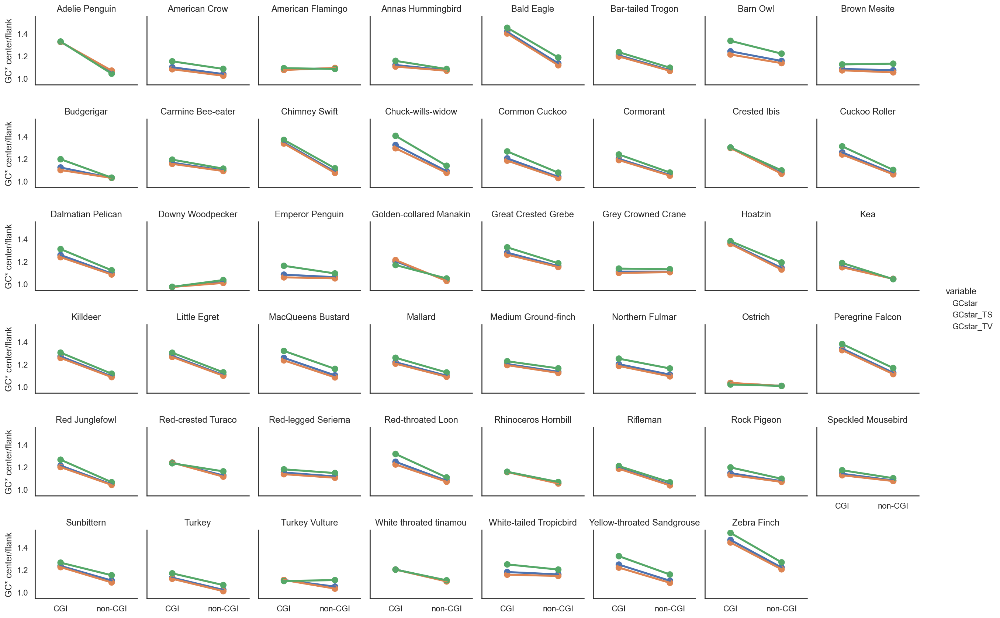

In [44]:
with sns.axes_style('white'):
    g = sns.FacetGrid(gc_star_ratios_rel_cgi,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True,
                      height=2, aspect=1.1
                     )
    g.map(sns.pointplot, 'cgi_overlapping', 'ratio',
          order=[True, False],
          errorbar=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    g.set_ylabels('GC* center/flank')
    g.set_xlabels('')
    g.set_xticklabels(['CGI', 'non-CGI'])
    plt.savefig(figures_path / 'poster_GCstar_hot_flank_ratios_indiv_species.pdf')                                

## -> Does GC*_cgi / GC*_noncgi correlate with hotspot strength?

Looking at Zebra Finch, it seems that CGI hotspots are stronger. The other species show the same pattern, except for the ones that where not hotspots overlap. So it is hard to distiguish lower heat of non-CGI hotspots and lower hotspot sharing across species.

## GC* peaks at CGI and non-CGI hotspots

GC* peaks at CGI hotspots:

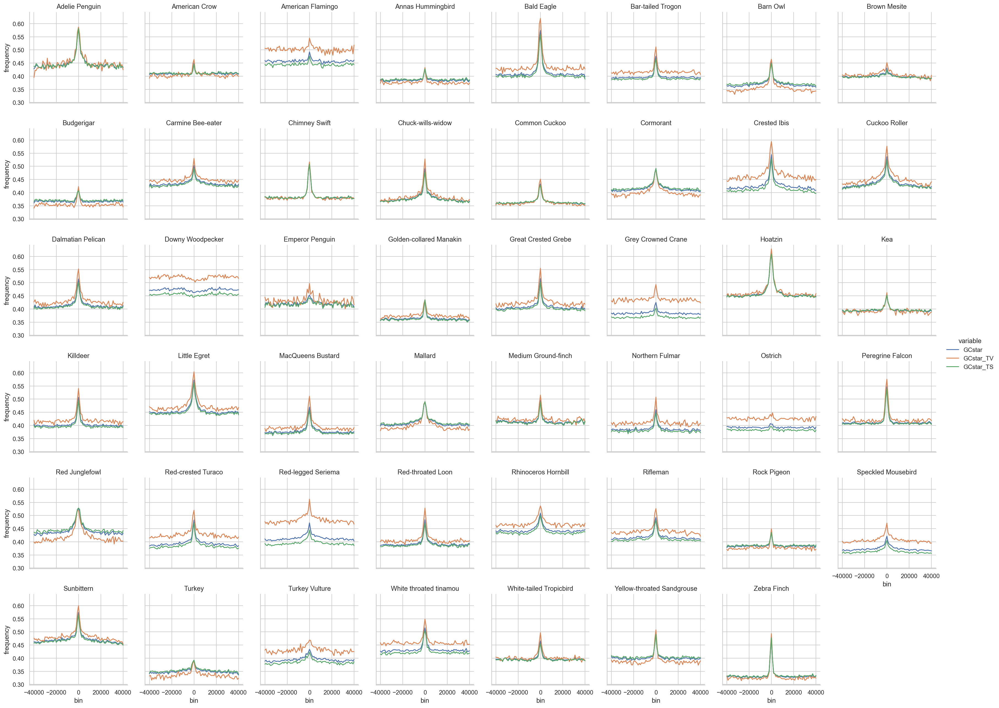

In [46]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star_rel_cgi.loc[gc_star_rel_cgi.cgi_overlapping],
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_cgi_hotspots.pdf')                    

__Looks like the GC* TV/TS ratio is quite differeent in the species__

GC* peaks at non-CGI hotspots:

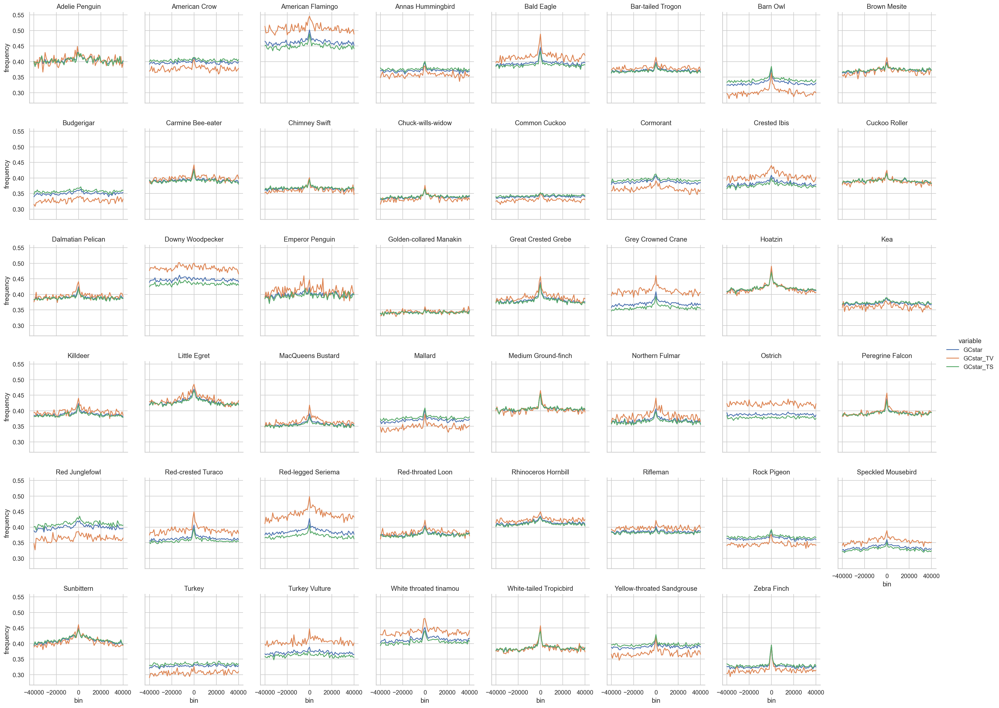

In [47]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star_rel_cgi.loc[~gc_star_rel_cgi.cgi_overlapping],
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_non-cgi_hotspots.pdf')                        

__In some species, like Common Cuckoo, the non-CGI hotspots are abandoned completely__

In [48]:
# gc_star_rel_cgi = pd.read_hdf('../results/gc_star_rel_cgi.h5')
# gc_star_rel_cgi.head()

In some species (the ones with the dips), non-CGI hotspots are less used than CGI ones.

To what extent does the unused non-CGI hotspots in some species, explain the GC* across all hotspots in each species?

I.e.: the dip in TAEGU shows that non-CGI hotspots are less hot. But of the dip is stronger in other species, a missing contribution from non-CGI hotspots could explain a weaker GC* peak in those species.

Maybe it is simpler to just inspect the GC* peaks in CGI and non-CGI hotspots separately...

In [49]:
plot_df = (pd.pivot(gc_star_rel_cgi, index=['species', 'species_code', 'bin', 'variable'], 
                    columns=['cgi_overlapping'], values=['frequency'])
          ).reset_index()
plot_df.columns = ['_'.join([str(x) for x in col if str(x)]).strip() for col in plot_df.columns.values]
plot_df['frequency_diff'] = plot_df.frequency_True - plot_df.frequency_False

For CGI hotpots:

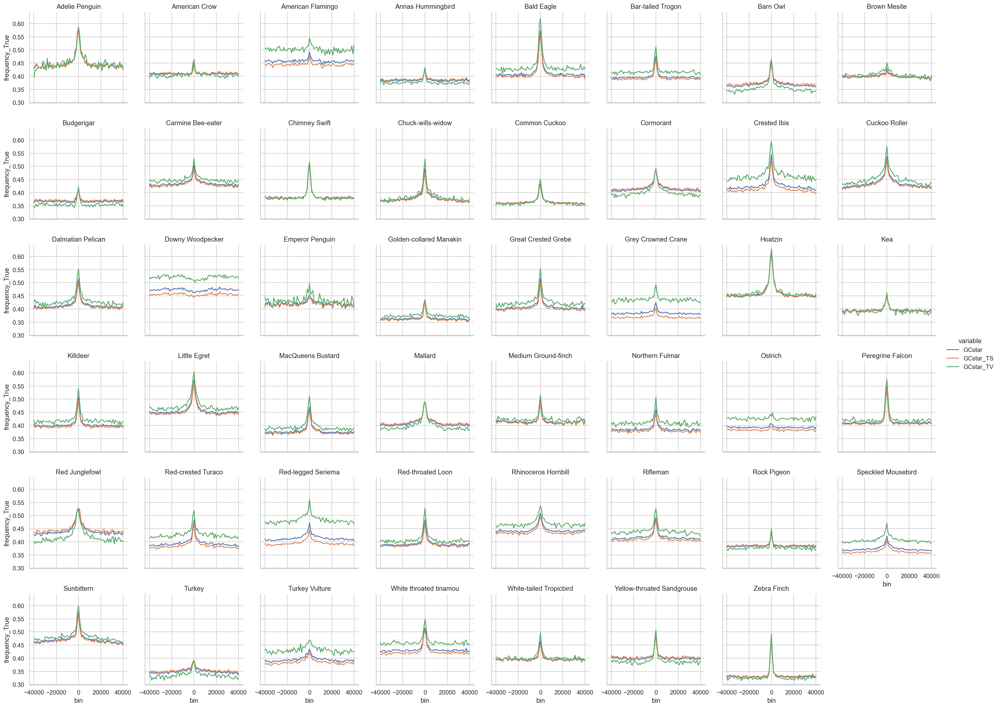

In [50]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency_True', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_cgi_hotspots.pdf')  

For non-CGI hotpots:

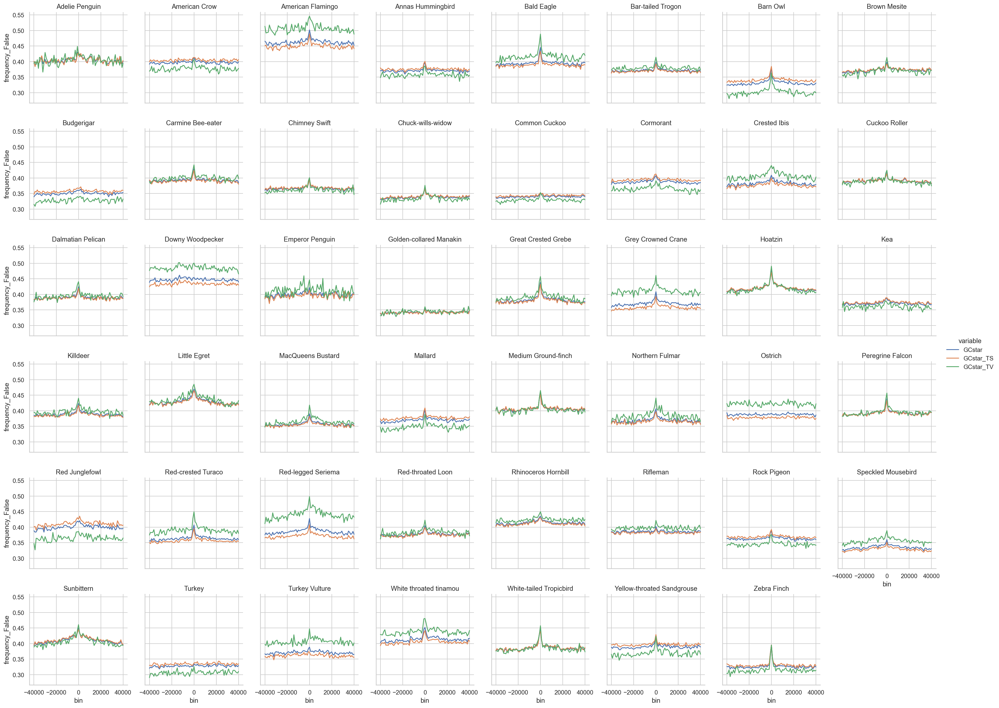

In [51]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency_False', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_across_non-cgi_hotspots.pdf')                            

**It seems that hotspots are not only enriched at CGI, buto also that the hotspots at CGIs have different substitution patterns and are the ones driving the GCstar peaks**



For freq diff between non-CGI and CGI hotpots:

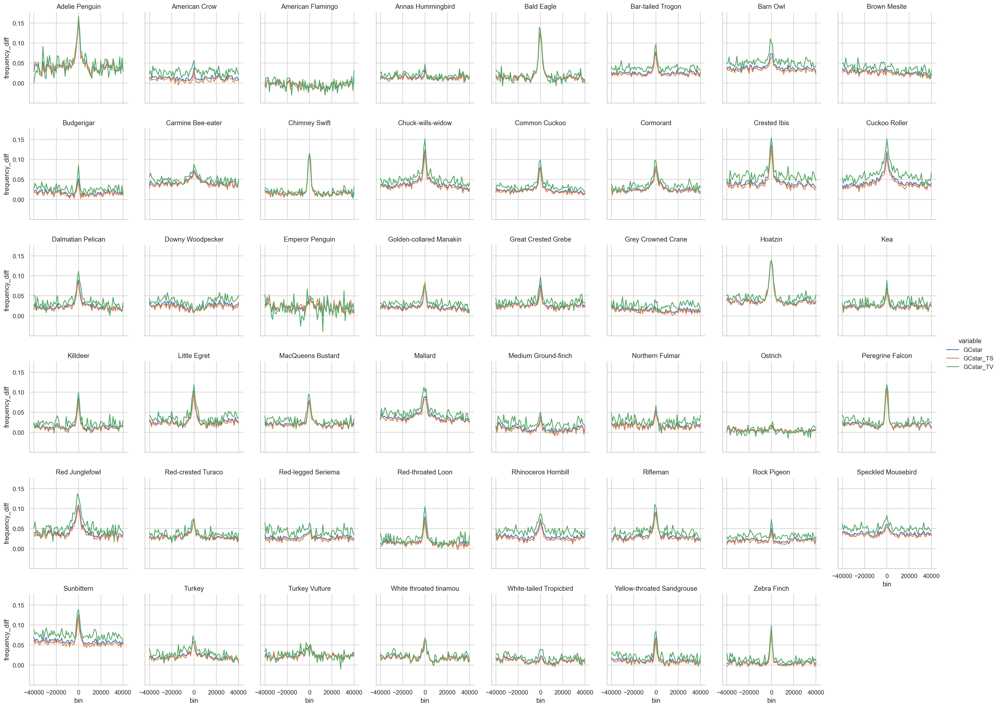

In [52]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency_diff', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_cgi_non-cgi_diff_across_hotspots.pdf')                            

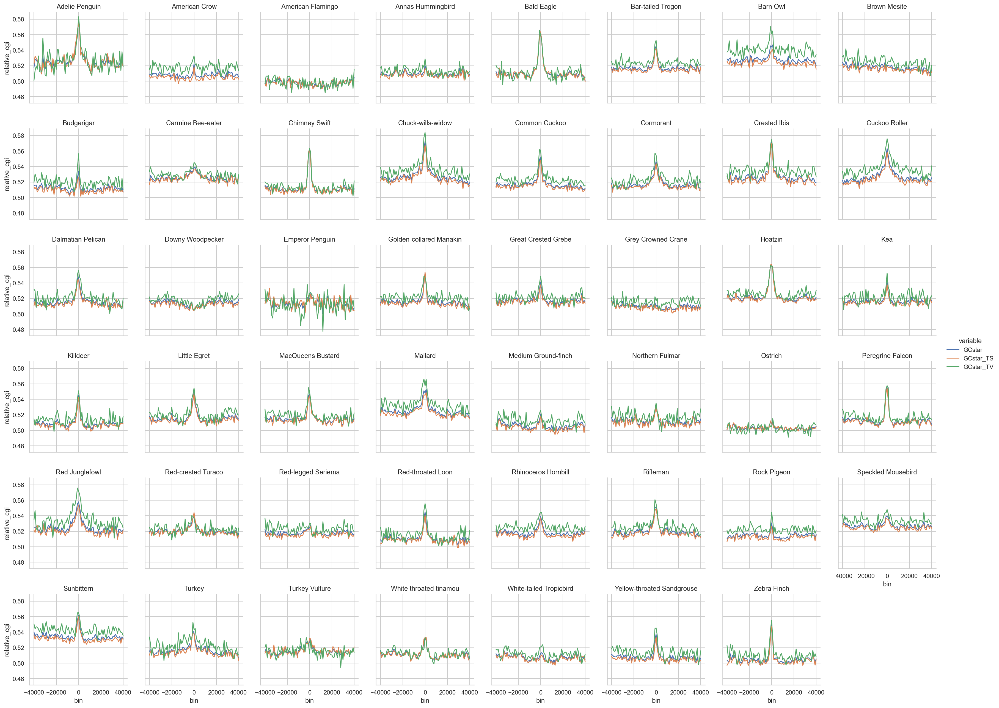

In [53]:
plot_df['relative_cgi'] = (plot_df.frequency_True) / (plot_df.frequency_True + plot_df.frequency_False)

with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'relative_cgi', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_cgi_rel_to_all_across_hotspots.pdf')                                

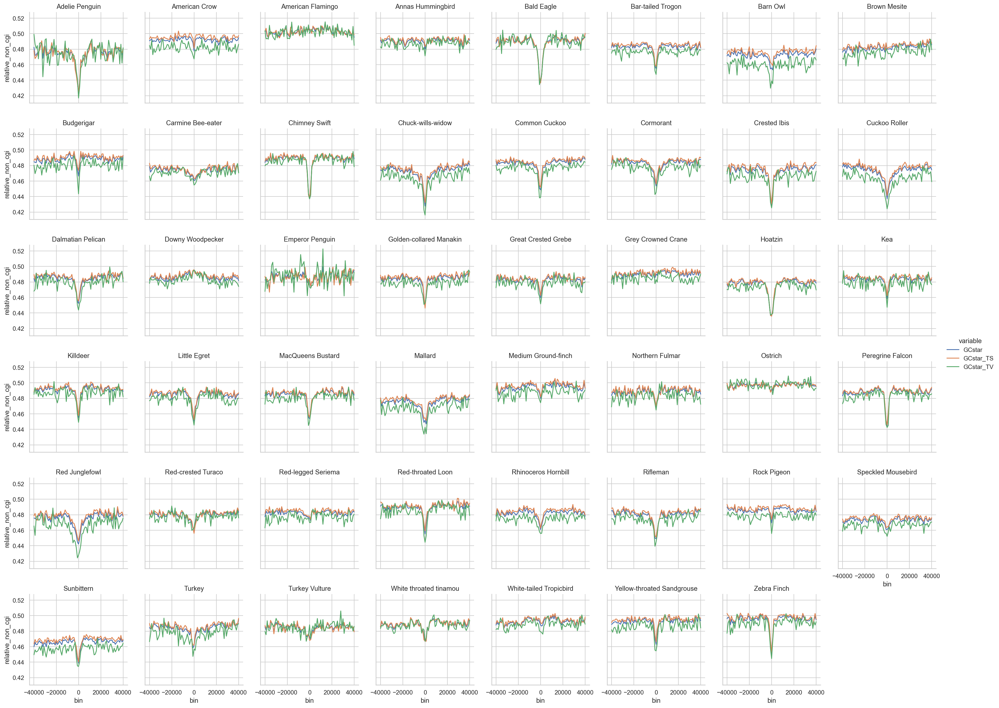

In [54]:
plot_df['relative_non_cgi'] = (plot_df.frequency_False) / (plot_df.frequency_True + plot_df.frequency_False)

with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable',
                      col_wrap=8, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'relative_non_cgi', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    plt.savefig(figures_path / 'GCstar_cgi_rel_to_all_across_hotspots.pdf')                                    